# Preparation

In [5]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Dataset Demonstration

## Prepare Dataset

In [7]:
""" Default or Suggested Settings """
PATCH_SIZE_2D = (64, 64)
PATCH_SIZE_3D = (32, 64, 64)
SLIDE_WINDOW_2D = (16, 16)
SLIDE_WINDOW_3D = (8, 16, 16)
NMODE_ENABLE = False
SEED = 42
MASK_MODE = "gaussian"  # "gaussian", "global_surrounding", "local_surrounding"
EPOCHS = 20

""" overwrite settings below """

""" Set PATCH_SIZE to either 2D or 3D based on your requirements"""
# PATCH_SIZE = PATCH_SIZE_2D
PATCH_SIZE = PATCH_SIZE_3D

if PATCH_SIZE == PATCH_SIZE_2D:
    SLIDE_WINDOW = SLIDE_WINDOW_2D
elif PATCH_SIZE == PATCH_SIZE_3D:
    SLIDE_WINDOW = SLIDE_WINDOW_3D
else:
    raise ValueError("Invalid PATCH_SIZE. Must be either PATCH_SIZE_2D or PATCH_SIZE_3D.")

# MASK_MODE = "local_surrounding"
EPOCHS = 10

NMODE_ENABLE = True

In [8]:
import random
import numpy as np
import torch

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def seed_worker(worker_id):
    """
    DataLoader 的 worker 初始化函數
    確保每個 worker 擁有獨立但固定的 NumPy/Python seed
    """
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)
    
seed_everything(SEED)

In [9]:
import pathlib
import sys, os
import tifffile
from torch.utils.data import DataLoader
from dataset import CalciumDataset

if "google.colab" in sys.modules:
    train_path = pathlib.Path("/content/drive/MyDrive/public/ai4life-cidc2025/train")
    valid_path = pathlib.Path("/content/drive/MyDrive/public/ai4life-cidc2025/valid")
    ground_truth_path = pathlib.Path("/content/drive/MyDrive/public/ai4life-cidc2025/valid/F0.tif")
else:
    train_path = pathlib.Path("data/train")
    valid_path = pathlib.Path("data/valid")
    ground_truth_path = pathlib.Path("data/valid/F0.tif")

train_paths = list(train_path.glob("*.tif"))
valid_paths = [p for p in valid_path.glob("*.tif") if "f0" not in p.name.lower()]
valid_paths.sort()
ground_truth = tifffile.imread(ground_truth_path)

print(len(train_paths), len(valid_paths))
print(train_paths)
print(valid_paths)

train_dataset = CalciumDataset(train_paths, subset="train", patch_size=PATCH_SIZE, samples_per_epoch=8000, mask_mode=MASK_MODE)
valid_dataset = CalciumDataset(valid_paths, subset="valid", patch_size=PATCH_SIZE, samples_per_epoch=2000, mask_mode=MASK_MODE)

4 3
[PosixPath('data/train/A1.tif'), PosixPath('data/train/B1.tif'), PosixPath('data/train/C2.tif'), PosixPath('data/train/D2.tif')]
[PosixPath('data/valid/F1.tif'), PosixPath('data/valid/F2.tif'), PosixPath('data/valid/F3.tif')]


In [58]:
for image in train_dataset.images:
    print(image.min(), image.max(), image.shape)
for image in valid_dataset.images:
    print(image.min(), image.max(), image.shape)
for normals in train_dataset.normals:
    print(normals)
for normals in valid_dataset.normals:
    print(normals)

-247 13306 (1500, 490, 490)
-256 10690 (1500, 490, 490)
-282 10479 (1500, 490, 490)
-285 23215 (1500, 490, 490)


-258 17198 (1500, 490, 490)
-286 20001 (1500, 490, 490)
-283 25006 (1500, 490, 490)
(np.float64(-89.0), np.float64(1275.0))
(np.float64(-89.0), np.float64(1275.0))
(np.float64(-89.0), np.float64(1275.0))
(np.float64(-89.0), np.float64(1275.0))
(np.float64(-100.0), np.float64(2090.0))
(np.float64(-100.0), np.float64(2090.0))
(np.float64(-100.0), np.float64(2090.0))


## Show Train Dataset

In [31]:
global_vmin, global_vmax = np.percentile(ground_truth, (3, 97))

sample_train_names = [path.name.split(".")[0] for path in train_paths]
sample_valid_names = [path.name.split(".")[0] for path in valid_paths]

print(sample_train_names, sample_valid_names)

['A1', 'B1', 'C2', 'D2'] ['F1', 'F2', 'F3']


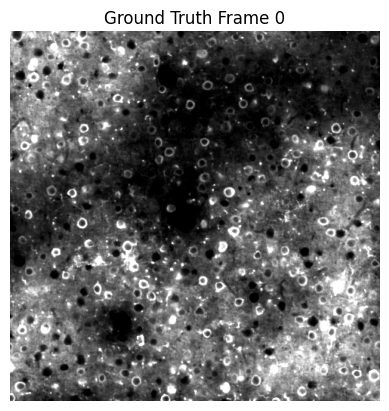

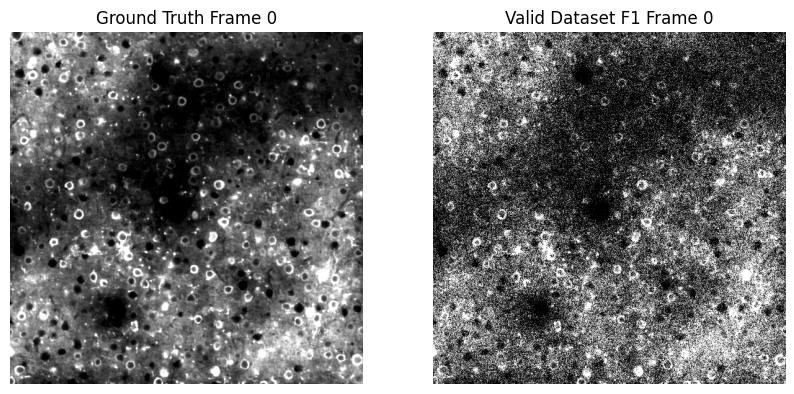

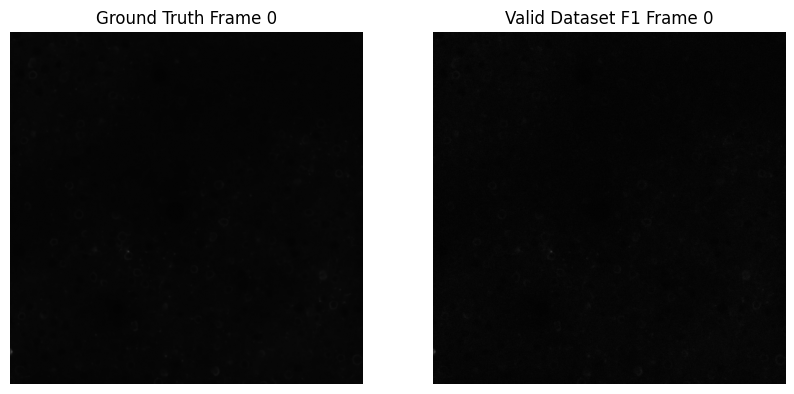

In [ ]:
import matplotlib.pyplot as plt

def show_single_image(image, title="", vmin=None, vmax=None):
    plt.imshow(image, cmap="gray", vmin=vmin, vmax=vmax)
    plt.title(title)
    plt.axis("off")
    plt.show()

def show_pair_images(image1, image2, title1="", title2="", vmin=None, vmax=None):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image1, cmap="gray", vmin=vmin, vmax=vmax)
    axes[0].set_title(title1)
    axes[0].axis("off")
    axes[1].imshow(image2, cmap="gray", vmin=vmin, vmax=vmax)
    axes[1].set_title(title2)
    axes[1].axis("off")
    plt.show()

show_single_image(ground_truth[0], title="Ground Truth Frame 0", vmin=global_vmin, vmax=global_vmax)
# show_single_image(valid_dataset.images[0][0], title="Valid Dataset F1 Frame 0", vmin=global_vmin, vmax=global_vmax)
show_pair_images(ground_truth[0], valid_dataset.images[0][0], title1="Ground Truth Frame 0", title2="Valid Dataset F1 Frame 0", vmin=global_vmin, vmax=global_vmax)
# show_pair_images(ground_truth[0], valid_dataset.images[0][0], title1="Ground Truth Frame 0", title2="Valid Dataset F1 Frame 0", vmin=valid_dataset.images[0].min(), vmax=valid_dataset.images[0].max())

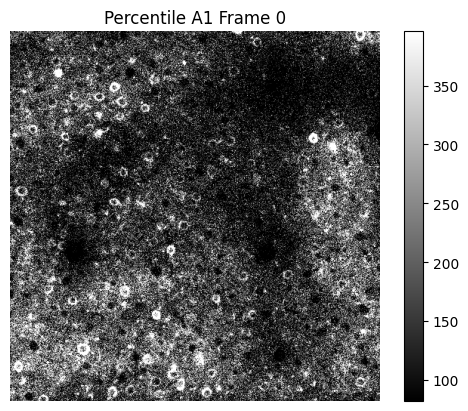

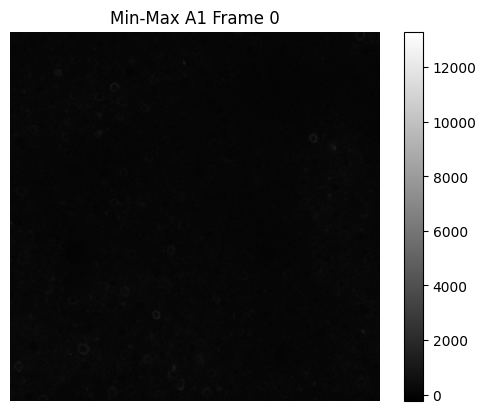

In [63]:

def show_single_image_with_value_bar(image, title="", vmin=None, vmax=None):
    plt.imshow(image, cmap="gray", vmin=vmin, vmax=vmax)
    plt.title(title)
    plt.axis("off")
    plt.colorbar()
    plt.show()


show_single_image_with_value_bar(train_dataset.images[0][0], title="Percentile A1 Frame 0", vmin=global_vmin, vmax=global_vmax)
show_single_image_with_value_bar(train_dataset.images[0][0], title="Min-Max A1 Frame 0", vmin=train_dataset.images[0].min(), vmax=train_dataset.images[0].max())

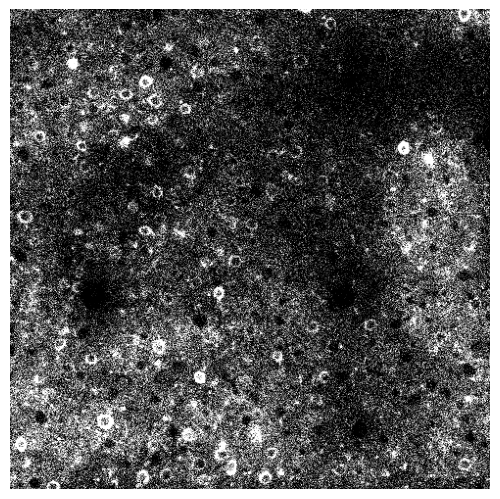

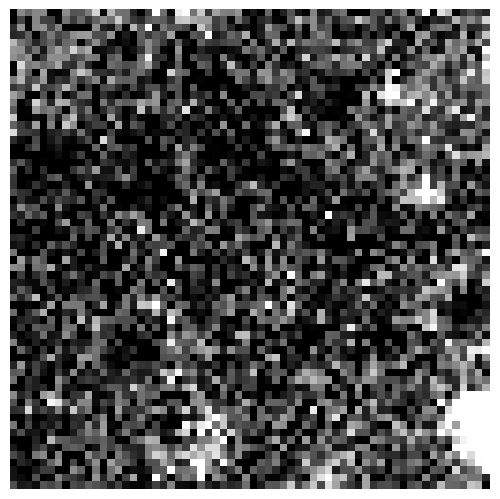

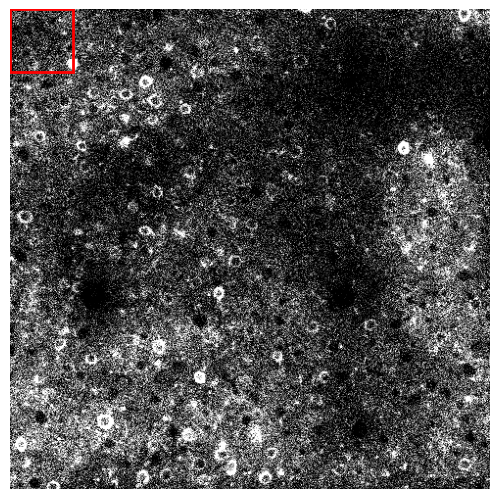

In [125]:
import matplotlib.patches

def show_single_frame_without_pad(image,vmin=None, vmax=None):
    plt.imshow(image, cmap="gray", vmin=vmin, vmax=vmax)
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.axis("off")
    plt.show()

def show_patch_without_pad(image_patch, vmin=None, vmax=None):
    plt.imshow(image_patch, cmap="gray", vmin=vmin, vmax=vmax)
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.axis("off")
    plt.show()

def show_single_frame_highlight_patch(image, patch, top_left, vmin=None, vmax=None):
    plt.imshow(image, cmap="gray", vmin=vmin, vmax=vmax)
    rect = matplotlib.patches.Rectangle(top_left, patch.shape[1], patch.shape[0], edgecolor='red', facecolor='none', linewidth=2)
    plt.gca().add_patch(rect)
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.axis("off")
    plt.show()

show_single_frame_without_pad(train_dataset.images[0][0], vmin=global_vmin, vmax=global_vmax)
show_patch_without_pad(train_dataset.images[0][0, 0:PATCH_SIZE[1], 0:PATCH_SIZE[2]], vmin=global_vmin, vmax=global_vmax)
show_single_frame_highlight_patch(train_dataset.images[0][0], train_dataset.images[0][0, 0:PATCH_SIZE[1], 0:PATCH_SIZE[2]], (0, 0), vmin=global_vmin, vmax=global_vmax)

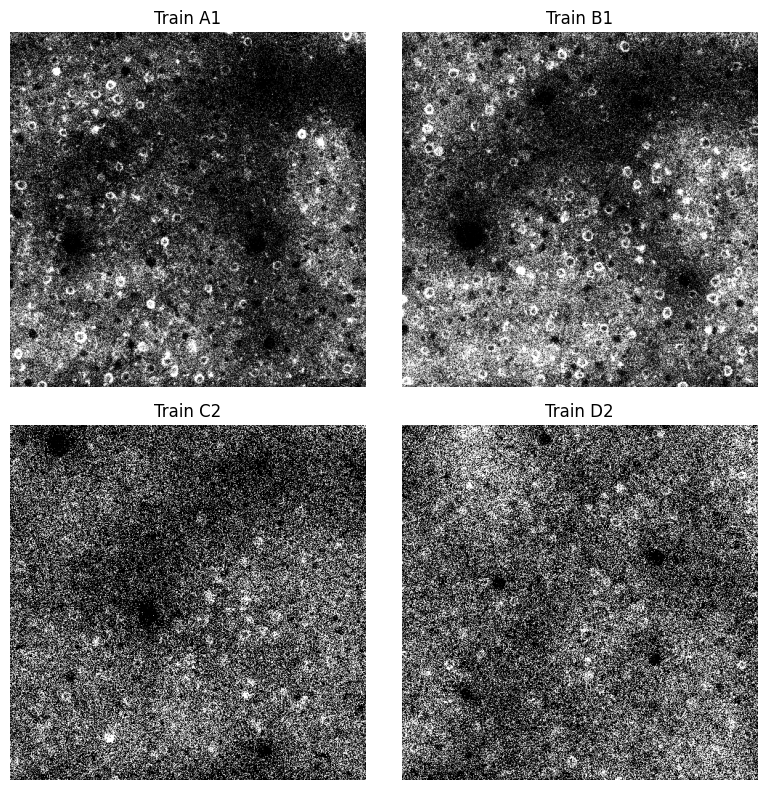

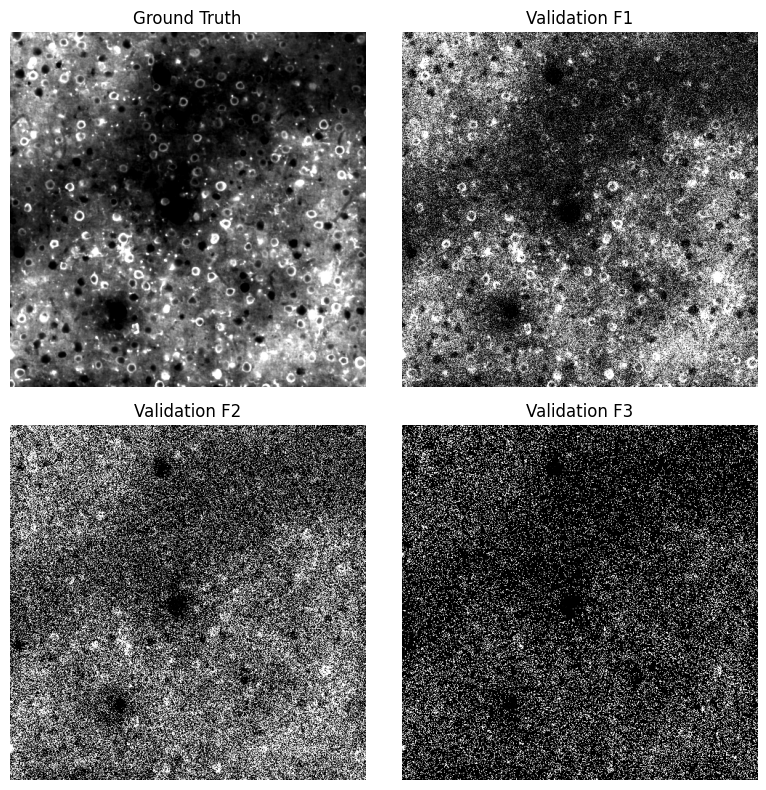

In [34]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
for i in range(len(train_dataset.images)):
    image = train_dataset.images[i]

    axes[i//2, i%2].imshow(image[0], cmap="gray", vmin=global_vmin, vmax=global_vmax)
    axes[i//2, i%2].set_title(f"Train {sample_train_names[i]}")
    axes[i//2, i%2].axis("off")
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes[0,0].imshow(ground_truth[0], cmap="gray", vmin=global_vmin, vmax=global_vmax)
axes[0,0].set_title(f"Ground Truth")
axes[0,0].axis("off")
for i in range(len(valid_dataset.images)):
    image = valid_dataset.images[i]

    ax_i = i + 1
    axes[ax_i//2, ax_i%2].imshow(image[0], cmap="gray", vmin=global_vmin, vmax=global_vmax)
    axes[ax_i//2, ax_i%2].set_title(f"Validation {sample_valid_names[i]}")
    axes[ax_i//2, ax_i%2].axis("off")
plt.tight_layout()
plt.show()

## Generate GIF animation

In [64]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

os.makedirs("animations", exist_ok=True)

def generate_gif(filename, data, fps=15, step=15):
    fig, ax = plt.subplots(figsize=(5, 5), dpi=72)

    sample = data[::step]

    im = ax.imshow(sample[0], cmap="gray", vmin=global_vmin, vmax=global_vmax)
    title = ax.set_title("Frame 0")
    ax.axis("off")
    fig.tight_layout()

    def animate(i):
        im.set_data(sample[i])
        title.set_text(f"Frame {i * step}")
        return [im, title]

    ani = animation.FuncAnimation(
        fig, animate, frames=len(sample), interval=1000/fps, blit=True)

    ani.save(filename, writer='pillow')
    plt.close()

def generate_nxn_gif(filename, dataset, titles, fps=15, step=15):
    n = 2
    fig, axes = plt.subplots(n, n, figsize=(8, 8), dpi=72)

    samples = [dataset[i][::step] for i in range(n * n)]

    plt.tight_layout()

    ims = []
    for i in range(n):
        for j in range(n):
            im = axes[i, j].imshow(samples[i * n + j][0], cmap="gray", vmin=global_vmin, vmax=global_vmax)
            axes[i, j].axis("off")
            axes[i, j].set_title(f"{titles[i * n + j]}")
            ims.append(im)

    def animate(frame):
        for idx, im in enumerate(ims):
            im.set_data(samples[idx][frame])
        return ims

    ani = animation.FuncAnimation(
        fig, animate, frames=len(samples[0]), interval=1000/fps, blit=True)

    ani.save(filename, writer='pillow')
    plt.close()

train_titles = [f"Train {name}" for name in sample_train_names]
valid_titles = ["Ground Truth"] + [f"Validation {name}" for name in sample_valid_names]

# generate_gif("animations/ground_truth.gif", ground_truth)
generate_nxn_gif("animations/train_samples.gif", train_dataset.images, train_titles)
generate_nxn_gif("animations/valid_samples.gif", [ground_truth] + valid_dataset.images, valid_titles)

# Static Result Evaluation

## SNR Evaluation

* spatial SNR (sSNR)
* temporal SNR (tSNR)
* spatial and temporal SNR (stSNR)

In [65]:
import pandas as pd

snr_results = pd.read_csv("results/result_SNR.csv")
snr_results

,Model,train_epoch,eval_best_epoch,F1_sSNR,F1_tSNR,F1_stSNR,F2_sSNR,F2_tSNR,F2_stSNR,F3_sSNR,F3_tSNR,F3_stSNR
0,2D U-Net,20,11,15.396517,18.705192,17.050854,13.032256,15.415544,14.223900,10.757767,11.498817,11.128292
1,3D U-Net,20,19,19.689609,23.009720,21.349665,17.430371,19.442852,18.436611,13.636476,14.293752,13.965114
2,nmODE U-Net,5,5,19.113963,21.893424,20.503693,16.539545,18.272575,17.406060,13.427196,13.762825,13.595011
3,nmODE U-Net,10,10,20.509717,24.118611,22.314164,17.767299,20.075491,18.921395,14.765265,15.542445,15.153855
4,nmODE U-Net,20,20,21.185938,24.727443,22.956690,18.267739,20.671192,19.469466,15.331398,16.645177,15.988287
5,nmODE U-Net,100,96,21.821621,25.180742,23.501181,19.055327,21.607998,20.331663,16.148141,18.065489,17.106815
6,CAREamics N2V U-Net,5,5,24.431701,24.647608,24.539655,20.466471,20.585487,20.525979,13.375767,12.278947,12.827357


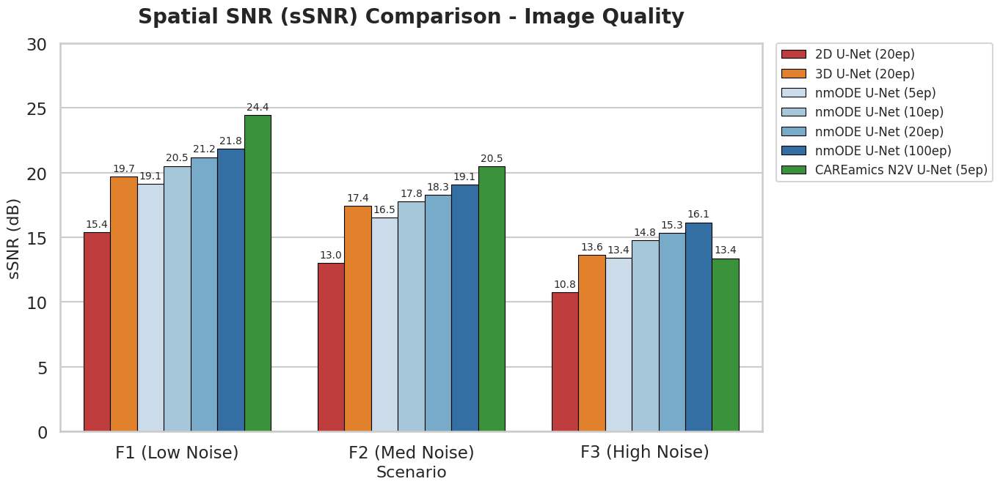

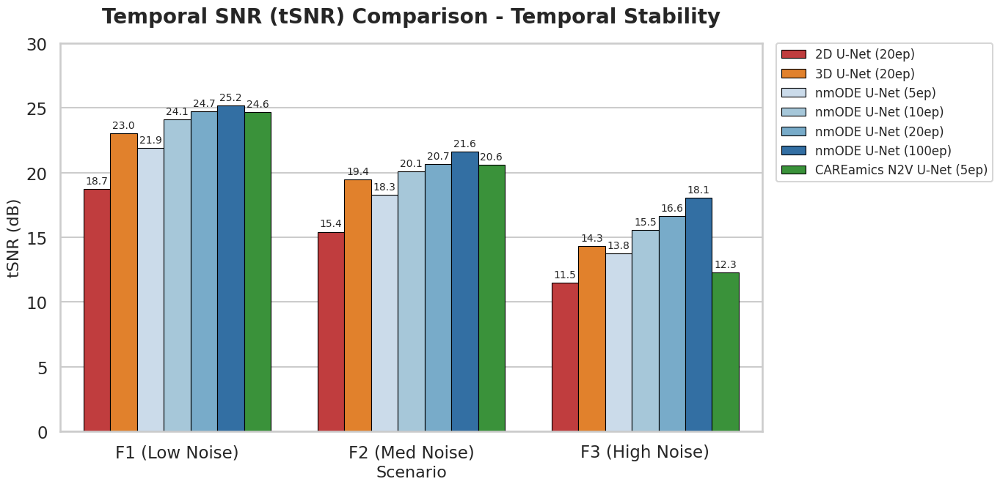

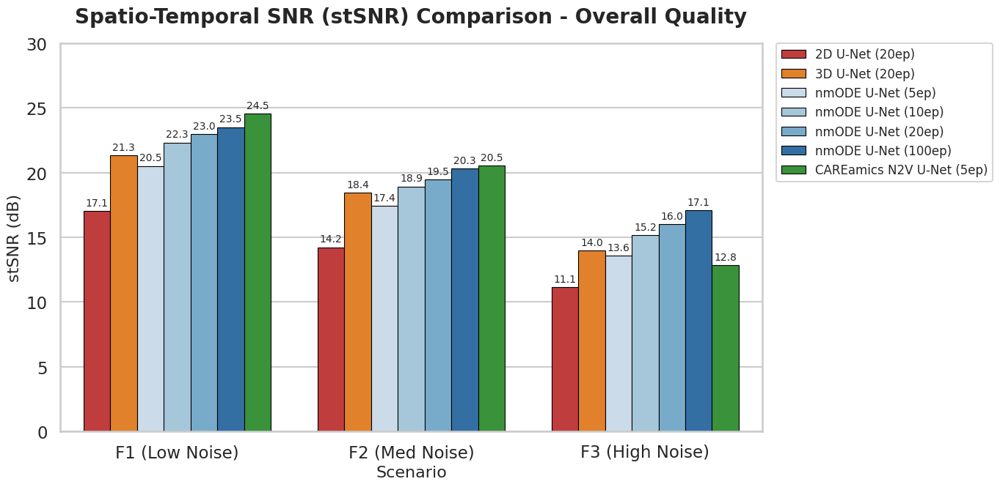

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假設你已經讀取了資料
# snr_results = pd.read_csv("results/result_SNR.csv")

# ==========================================
# 1. 資料前處理 (Preprocessing)
# ==========================================

# 建立一個包含 Epoch 的完整標籤 (Unique Label)
snr_results['Label'] = snr_results.apply(
    lambda row: f"{row['Model']} ({int(row['train_epoch'])}ep)", axis=1
)

# 定義顯示順序 (Hue Order) - 確保圖例依照邏輯排列
hue_order = [
    '2D U-Net (20ep)', 
    '3D U-Net (20ep)', 
    'nmODE U-Net (5ep)', 
    'nmODE U-Net (10ep)', 
    'nmODE U-Net (20ep)', 
    'nmODE U-Net (100ep)', 
    'CAREamics N2V U-Net (5ep)'
]

# 定義配色 (Color Palette) - 與之前的 Matplotlib 版本一致
custom_palette = {
    '2D U-Net (20ep)': '#d62728',       # Red
    '3D U-Net (20ep)': '#ff7f0e',       # Orange
    'nmODE U-Net (5ep)': '#c6dbef',     # Light Blue
    'nmODE U-Net (10ep)': '#9ecae1',    # Med-Light Blue
    'nmODE U-Net (20ep)': '#6baed6',    # Med Blue
    'nmODE U-Net (100ep)': '#2171b5',   # Dark Blue
    'CAREamics N2V U-Net (5ep)': '#2ca02c' # Green
}

# 將資料轉為 Long Format (Melt) 以符合 Seaborn 需求
metric_columns = [col for col in snr_results.columns if 'SNR' in col]
df_melted = snr_results.melt(
    id_vars=['Label'], 
    value_vars=metric_columns, 
    var_name='Metric_Key', 
    value_name='Score'
)

# 從欄位名稱解析 Scenario (F1/F2/F3) 和 Metric (sSNR/tSNR)
# 例如: "F1_sSNR" -> Scenario="F1", Metric="sSNR"
df_melted[['Scenario', 'Metric']] = df_melted['Metric_Key'].str.extract(r'(F\d)_(.*)')

# 優化 Scenario 顯示名稱
scenario_map = {
    'F1': 'F1 (Low Noise)', 
    'F2': 'F2 (Med Noise)', 
    'F3': 'F3 (High Noise)'
}
df_melted['Scenario_Label'] = df_melted['Scenario'].map(scenario_map)

# ==========================================
# 2. 繪圖函數 (Plotting Function)
# ==========================================

def plot_snr_comparison(metric_type, title, filename):
    plt.figure(figsize=(14, 7))
    sns.set_theme(style="whitegrid", context="talk") # 設定主題與字體大小
    
    # 篩選特定指標 (sSNR 或 tSNR)
    data_subset = df_melted[df_melted['Metric'] == metric_type]
    
    # 繪製長條圖
    ax = sns.barplot(
        data=data_subset,
        x='Scenario_Label',
        y='Score',
        hue='Label',
        hue_order=hue_order,
        palette=custom_palette,
        edgecolor='black',  # 加上邊框增加清晰度
        linewidth=0.8,
        err_kws={'linewidth': 0} # 不顯示誤差線(如果有)
    )
    
    # 設定標題與軸標籤
    plt.title(title, fontsize=20, fontweight='bold', pad=20)
    plt.ylabel(f'{metric_type} (dB)', fontsize=16)
    plt.xlabel('Scenario', fontsize=16)
    plt.ylim(0, 30) # 固定 Y 軸範圍方便比較
    
    # 設定圖例位置 (放在圖外右側)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize=12)
    
    # 在 Bar 上顯示數值 (Bar Labels)
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f', padding=3, fontsize=10)
        
    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight') # 存檔
    plt.show()

# ==========================================
# 3. 執行繪圖
# ==========================================

# 畫 sSNR (空間品質)
plot_snr_comparison(
    'sSNR', 
    'Spatial SNR (sSNR) Comparison - Image Quality', 
    'sSNR_comparison_seaborn.png'
)

# 畫 tSNR (時間穩定性)
plot_snr_comparison(
    'tSNR', 
    'Temporal SNR (tSNR) Comparison - Temporal Stability', 
    'tSNR_comparison_seaborn.png'
)

plot_snr_comparison(
    "stSNR",
    "Spatio-Temporal SNR (stSNR) Comparison - Overall Quality",
    "stSNR_comparison_seaborn.png"
)

=== 🏆 Final Score Leaderboard (Avg stSNR) ===
                    Label  Final_Score  F1_stSNR  F2_stSNR  F3_stSNR
      nmODE U-Net (100ep)        20.31     23.50     20.33     17.11
       nmODE U-Net (20ep)        19.47     22.96     19.47     15.99
CAREamics N2V U-Net (5ep)        19.30     24.54     20.53     12.83
       nmODE U-Net (10ep)        18.80     22.31     18.92     15.15
          3D U-Net (20ep)        17.92     21.35     18.44     13.97
        nmODE U-Net (5ep)        17.17     20.50     17.41     13.60
          2D U-Net (20ep)        14.13     17.05     14.22     11.13


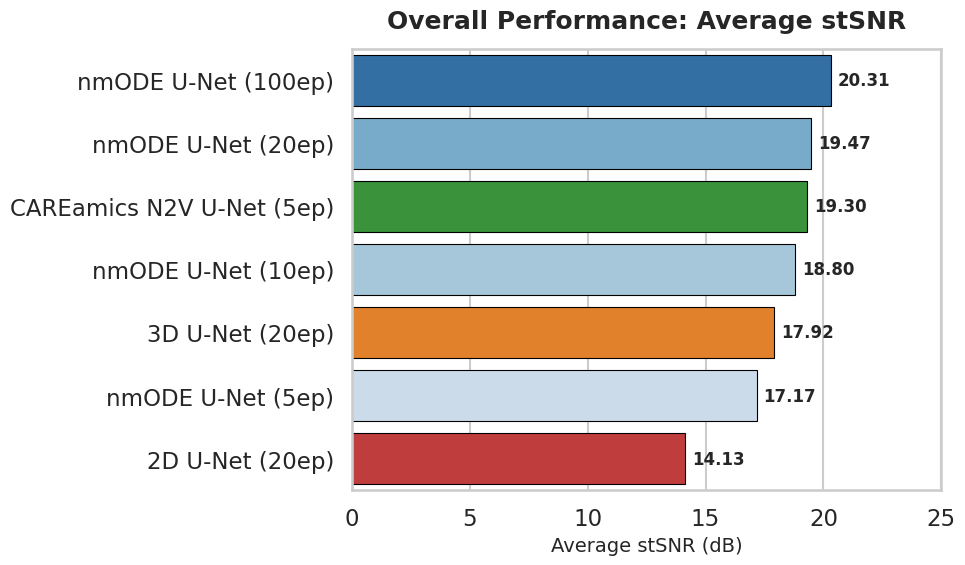

In [135]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_and_plot_final_score(df):
    """
    計算 Final Score (F1, F2, F3 的 stSNR 平均值) 並繪製排行榜。
    (已修正 Seaborn Deprecation Warning)
    """
    # 1. 確保有 Label 欄位 (如果尚未建立)
    if 'Label' not in df.columns:
        df['Label'] = df.apply(
            lambda row: f"{row['Model']} ({int(row['train_epoch'])}ep)", axis=1
        )

    # 2. 計算 Final Score: Average stSNR
    target_cols = ['F1_stSNR', 'F2_stSNR', 'F3_stSNR']
    df['Final_Score'] = df[target_cols].mean(axis=1)

    # 3. 依照分數高低排序
    df_sorted = df.sort_values('Final_Score', ascending=False).reset_index(drop=True)

    # 顯示文字版排名
    print("=== 🏆 Final Score Leaderboard (Avg stSNR) ===")
    display_cols = ['Label', 'Final_Score'] + target_cols
    print(df_sorted[display_cols].to_string(index=False, float_format="%.2f"))

    # 4. 繪製排行榜 (Horizontal Bar Chart)
    plt.figure(figsize=(10, 6))
    sns.set_theme(style="whitegrid", context="talk")

    # 定義配色
    custom_palette = {
        '2D U-Net (20ep)': '#d62728',       # Red
        '3D U-Net (20ep)': '#ff7f0e',       # Orange
        'nmODE U-Net (5ep)': '#c6dbef',     # Light Blue
        'nmODE U-Net (10ep)': '#9ecae1',    # Med-Light Blue
        'nmODE U-Net (20ep)': '#6baed6',    # Med Blue
        'nmODE U-Net (100ep)': '#2171b5',   # Dark Blue (Champion)
        'CAREamics N2V U-Net (5ep)': '#2ca02c' # Green
    }

    ax = sns.barplot(
        data=df_sorted,
        x='Final_Score',
        y='Label',
        hue='Label',      # <--- 【修正點 1】將 hue 設為與 y 相同
        legend=False,     # <--- 【修正點 2】隱藏重複的圖例
        palette=custom_palette,
        edgecolor='black',
        linewidth=0.8
    )

    # 設定標題與標籤
    plt.title('Overall Performance: Average stSNR', fontsize=18, fontweight='bold', pad=15)
    plt.xlabel('Average stSNR (dB)', fontsize=14)
    plt.ylabel('')  
    plt.xlim(0, 25) 

    # 在 Bar 旁標示具體分數
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', padding=5, fontsize=12, fontweight='bold')

    plt.tight_layout()
    # plt.savefig('final_score_leaderboard.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return df_sorted

# ==========================================
# 執行計算
# ==========================================
final_results = calculate_and_plot_final_score(snr_results)

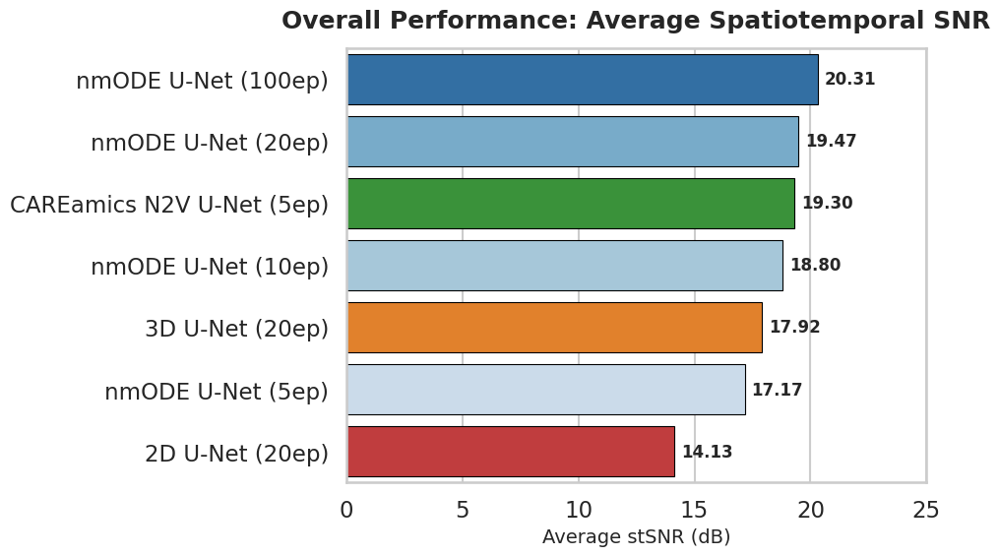

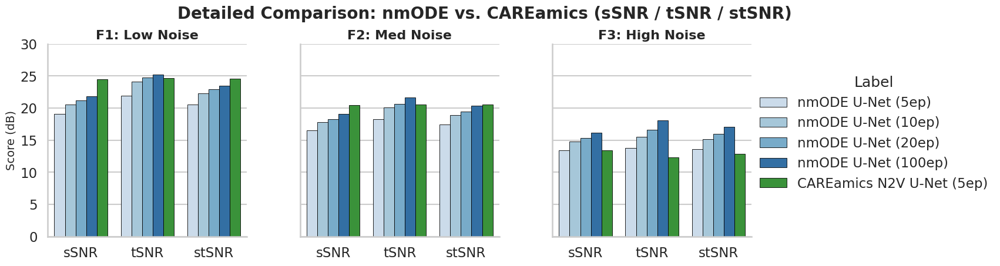

In [142]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 定義全域配色 (維持視覺一致性)
colors_map = {
    '2D U-Net (20ep)': '#d62728',       # Red (Excluded in 2nd plot)
    '3D U-Net (20ep)': '#ff7f0e',       # Orange (Excluded in 2nd plot)
    'nmODE U-Net (5ep)': '#c6dbef',     # Light Blue
    'nmODE U-Net (10ep)': '#9ecae1',    # Med-Light Blue
    'nmODE U-Net (20ep)': '#6baed6',    # Med Blue
    'nmODE U-Net (100ep)': '#2171b5',   # Dark Blue (Champion)
    'CAREamics N2V U-Net (5ep)': '#2ca02c' # Green (Competitor)
}

# ==============================================================================
# Function 1: Final Score Leaderboard (一圖定勝負)
# ==============================================================================
def calculate_and_plot_final_score(df):
    """
    計算並繪製 Final Score (Average stSNR across F1, F2, F3)。
    """
    df = df.copy()
    
    # 1. 確保 Label 存在
    if 'Label' not in df.columns:
        df['Label'] = df.apply(lambda row: f"{row['Model']} ({int(row['train_epoch'])}ep)", axis=1)

    # 2. 計算 Final Score
    target_cols = ['F1_stSNR', 'F2_stSNR', 'F3_stSNR']
    df['Final_Score'] = df[target_cols].mean(axis=1)

    # 3. 排序
    df_sorted = df.sort_values('Final_Score', ascending=False).reset_index(drop=True)

    # 4. 繪圖
    plt.figure(figsize=(10, 6))
    sns.set_theme(style="whitegrid", context="talk")

    ax = sns.barplot(
        data=df_sorted,
        x='Final_Score',
        y='Label',
        hue='Label',      # 修正 Seaborn Warning
        legend=False,
        palette=colors_map,
        edgecolor='black',
        linewidth=0.8
    )

    plt.title('Overall Performance: Average Spatiotemporal SNR', fontsize=18, fontweight='bold', pad=15)
    plt.xlabel('Average stSNR (dB)', fontsize=14)
    plt.ylabel('')
    plt.xlim(0, 25)

    # 標示數值
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', padding=5, fontsize=12, fontweight='bold')

    plt.tight_layout()
    # plt.savefig('final_score_leaderboard.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return df_sorted

# ==============================================================================
# Function 2: Detailed Comparison (nmODE vs CAREamics) (三場景 x 三指標)
# ==============================================================================
def plot_detailed_comparison(df):
    """
    比較 nmODE 系列與 CAREamics 在 F1, F2, F3 下的 sSNR, tSNR, stSNR。
    使用 FacetGrid 分圖展示。
    """
    df = df.copy()
    if 'Label' not in df.columns:
        df['Label'] = df.apply(lambda row: f"{row['Model']} ({int(row['train_epoch'])}ep)", axis=1)

    # 1. 篩選模型 (只保留 nmODE 和 CAREamics)
    target_keywords = ['nmODE', 'CAREamics']
    df_filtered = df[df['Label'].apply(lambda x: any(k in x for k in target_keywords))].copy()

    # 2. 轉換為長格式 (Melt) 以包含所有指標
    # 抓取所有 SNR 相關欄位
    metric_cols = [c for c in df.columns if 'SNR' in c and ('F1' in c or 'F2' in c or 'F3' in c)]
    
    df_melted = df_filtered.melt(
        id_vars=['Label'], 
        value_vars=metric_cols,
        var_name='Metric_Key', 
        value_name='Score'
    )

    # 3. 解析欄位 (e.g., F1_sSNR -> Scenario=F1, Metric=sSNR)
    df_melted[['Scenario', 'Metric']] = df_melted['Metric_Key'].str.extract(r'(F\d)_(.*)')
    
    # 優化顯示標籤
    scenario_map = {'F1': 'F1: Low Noise', 'F2': 'F2: Med Noise', 'F3': 'F3: High Noise'}
    df_melted['Scenario_Label'] = df_melted['Scenario'].map(scenario_map)

    # 定義順序
    model_order = [
        'nmODE U-Net (5ep)', 'nmODE U-Net (10ep)', 
        'nmODE U-Net (20ep)', 'nmODE U-Net (100ep)', 
        'CAREamics N2V U-Net (5ep)'
    ]
    # 只保留 filtered data 中有的模型
    hue_order = [m for m in model_order if m in df_filtered['Label'].unique()]

    # 4. 繪圖 (FacetGrid)
    g = sns.catplot(
        data=df_melted,
        kind="bar",
        x="Metric", 
        y="Score", 
        hue="Label",
        col="Scenario_Label",  # 每個場景一張分圖
        col_order=['F1: Low Noise', 'F2: Med Noise', 'F3: High Noise'],
        hue_order=hue_order,
        palette=colors_map,
        edgecolor='black',
        linewidth=0.6,
        height=5, 
        aspect=0.9,
        legend_out=True
    )

    # 設定標題與調整
    g.fig.subplots_adjust(top=0.85)
    g.fig.suptitle('Detailed Comparison: nmODE vs. CAREamics (sSNR / tSNR / stSNR)', fontsize=20, fontweight='bold')
    g.set_axis_labels("", "Score (dB)", fontsize=14)
    g.set_titles("{col_name}", size=16, fontweight='bold')
    
    # 設定 Y 軸範圍
    g.set(ylim=(0, 30))

    # 加上數值標籤 (Optional, 如果覺得太擠可以註解掉)
    # for ax in g.axes.flat:
    #     for container in ax.containers:
    #         ax.bar_label(container, fmt='%.1f', padding=2, fontsize=9, rotation=45)

    # 移動圖例標題
    # sns.move_legend(g, "upper left", bbox_to_anchor=(1, 0.8), title="Model")

    # plt.savefig('detailed_comparison_nmODE_vs_CAREamics.png', dpi=300, bbox_inches='tight')
    plt.show()

# ==============================================================================
# 執行繪圖
# ==============================================================================
# 假設 snr_results 是你的 DataFrame
final_scores = calculate_and_plot_final_score(snr_results)
plot_detailed_comparison(snr_results)

# Inference Evaluation

For faster evaluation, you should use **GPU** to run below blocks.

In [80]:
import os

os.makedirs("demo", exist_ok=True)

""" check models in demo folder """
demo_models = os.listdir("demo")
print(demo_models)

['nmode_best_model_state_dict.pth']


In [81]:
import torch
from model_arch.unet import UNet, UNet3D, UNetnmODE
from inference import denoise_video

eval_model = UNetnmODE()
eval_model.load_state_dict(torch.load("demo/nmode_best_model_state_dict.pth"))

<All keys matched successfully>

In [83]:
from eval import calc_metrics

denoised_videos = []

for i, video in enumerate(valid_dataset.images):
    print(video.shape)

    lower, upper = valid_dataset.normals[i]
    video = np.clip(video, lower, upper)
    video = (video - lower) / (upper - lower + 1e-8)

    denoised_video = denoise_video(eval_model, video, patch_size=PATCH_SIZE, slide_window=SLIDE_WINDOW, batch_size=64, skip_frame=False)

    # restore normalization
    denoised_video = denoised_video.squeeze(0).squeeze(0).cpu().numpy()
    denoised_video = denoised_video * (upper - lower + 1e-8) + lower

    # metrics
    s_snr, t_snr, st_snr = calc_metrics(clean_video=ground_truth, denoised_video=denoised_video)
    print(f"F{i+1}: sSNR = {s_snr:.4f}, tSNR = {t_snr:.4f}, stSNR = {st_snr:.4f}")

    denoised_videos.append(denoised_video)

denoised_videos[0][0]

(1500, 490, 490)


100%|██████████| 47/47 [05:06<00:00,  6.51s/it]


F1: sSNR = 21.8215, tSNR = 25.1806, stSNR = 23.5010
(1500, 490, 490)


100%|██████████| 47/47 [05:06<00:00,  6.51s/it]


F2: sSNR = 19.0553, tSNR = 21.6080, stSNR = 20.3317
(1500, 490, 490)


100%|██████████| 47/47 [05:05<00:00,  6.51s/it]


F3: sSNR = 16.1482, tSNR = 18.0655, stSNR = 17.1068


array([[397.31072039, 345.6062001 , 282.39287347, ..., 122.35801116,
        120.72047629, 120.51535815],
       [394.64110077, 333.02577347, 265.29439807, ..., 120.92809089,
        118.46140295, 117.42864922],
       [392.58978889, 331.18295729, 261.43172875, ..., 123.97346944,
        116.93053082, 115.28615922],
       ...,
       [153.50865334, 148.19933906, 151.12261921, ..., 326.33720249,
        325.36380917, 317.73673013],
       [180.10880903, 170.84571257, 167.88474068, ..., 333.50587815,
        337.19702557, 324.27603528],
       [216.17608607, 205.46383187, 199.87794832, ..., 317.07557455,
        333.3470507 , 318.56797174]], shape=(490, 490))

## Image Histogram

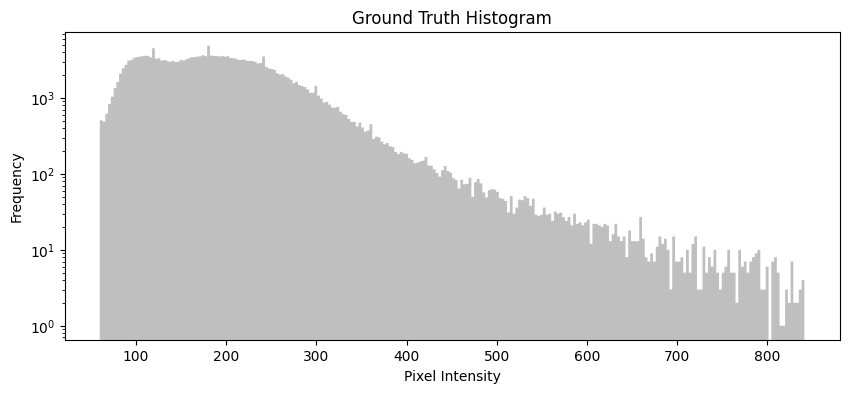

In [97]:
import matplotlib.pyplot as plt
import numpy as np

gt_vmin, gt_vmax = np.percentile(ground_truth, (1, 99.9))

def show_image_histogram(image, title="Image Histogram"):
    vmin, vmax = gt_vmin, gt_vmax
    
    plt.figure(figsize=(10, 4))
    plt.hist(image.flatten(), bins=256, color='gray', alpha=0.5, range=(vmin, vmax), log=True, histtype='stepfilled')
    plt.title(title)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    # plt.grid()
    plt.show()

show_image_histogram(ground_truth[0], title="Ground Truth Histogram")

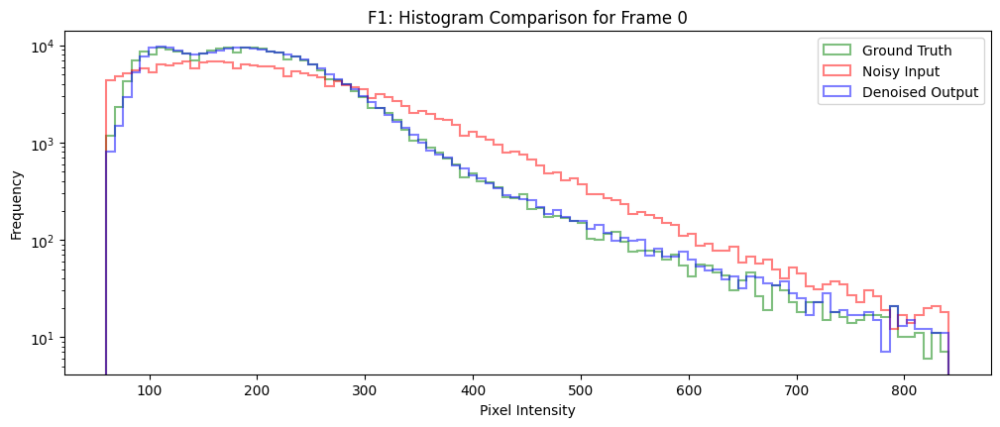

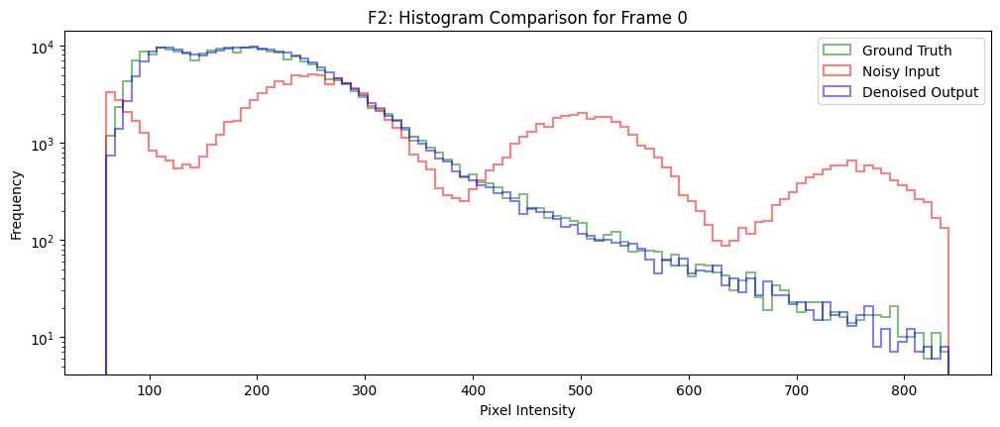

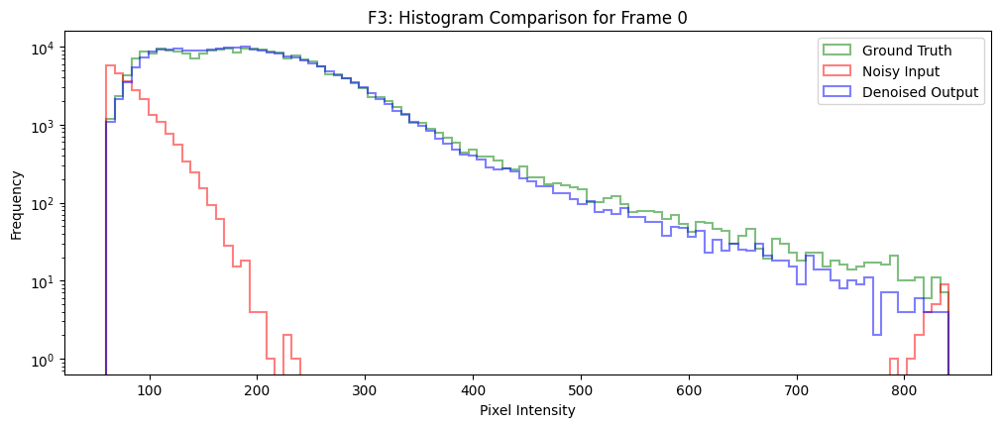

In [118]:
def compare_histograms(ground_truth, noisy_video, denoised_video, img_idx=0, topic=""):

    colors = ['green', 'red', 'blue']
    labels = ['Ground Truth', 'Noisy Input', 'Denoised Output']
    images = [ground_truth[img_idx], noisy_video[img_idx], denoised_video[img_idx]]
    
    plt.figure(figsize=(10, 4))
    for img, color, label in zip(images, colors, labels):
        plt.hist(img.flatten(), bins=100, color=color, 
                 alpha=0.5, log=True, histtype='step', label=label, linewidth=1.5,
                 range=(gt_vmin, gt_vmax))
    
    plt.tight_layout()
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.title(f"{topic}: Histogram Comparison for Frame {img_idx}")
    plt.legend()
    plt.show()

compare_histograms(ground_truth, valid_dataset.images[0], denoised_videos[0], img_idx=0, topic="F1")
compare_histograms(ground_truth, valid_dataset.images[1], denoised_videos[1], img_idx=0, topic="F2")
compare_histograms(ground_truth, valid_dataset.images[2], denoised_videos[2], img_idx=0, topic="F3")

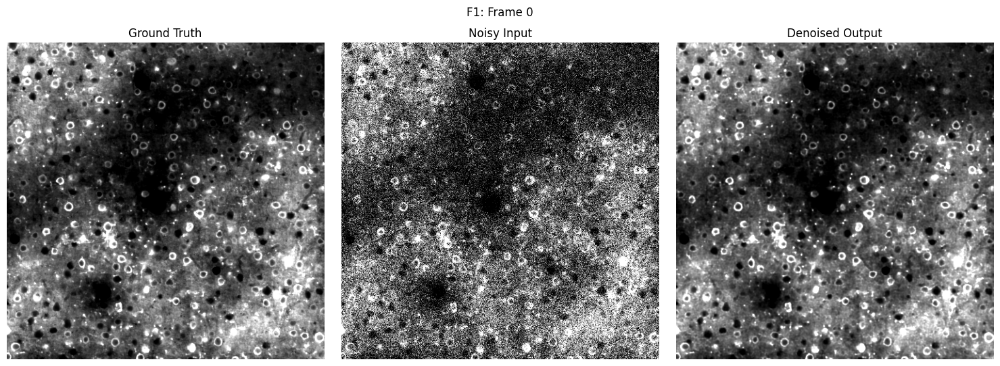

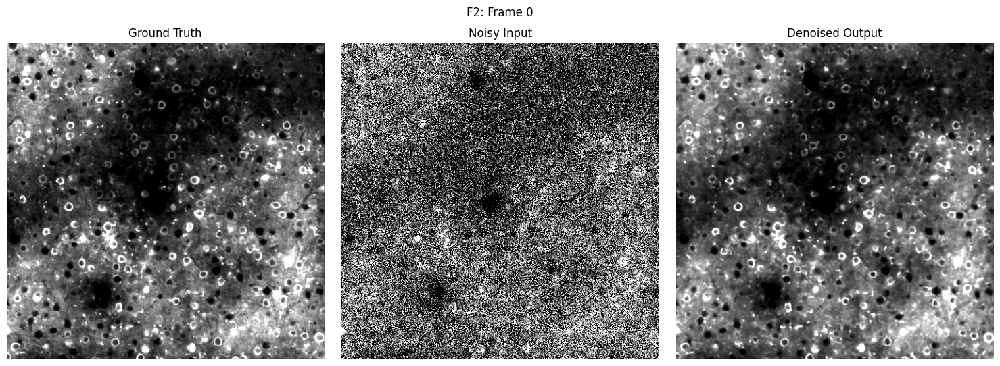

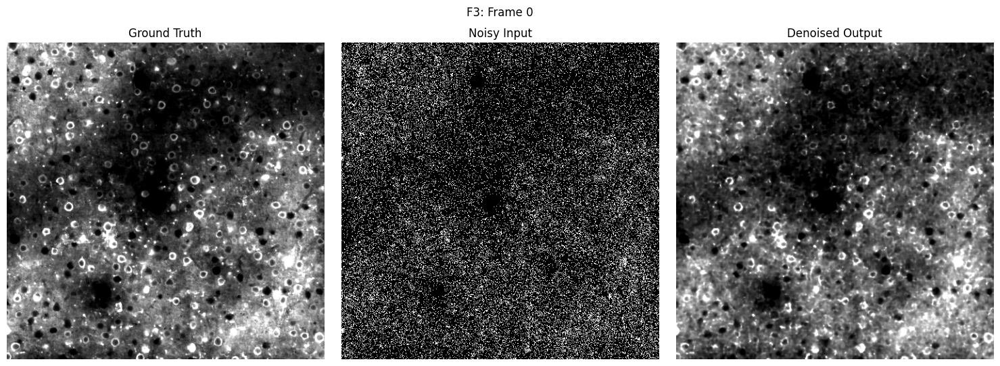

In [124]:
def compare_views(ground_truth, noisy_video, denoised_video, img_idx=0, topic=""):
    vmin, vmax = global_vmin, global_vmax

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(ground_truth[img_idx], cmap="gray", vmin=vmin, vmax=vmax)
    axes[0].set_title("Ground Truth")
    axes[0].axis("off")
    
    axes[1].imshow(noisy_video[img_idx], cmap="gray", vmin=vmin, vmax=vmax)
    axes[1].set_title("Noisy Input")
    axes[1].axis("off")
    
    axes[2].imshow(denoised_video[img_idx], cmap="gray", vmin=vmin, vmax=vmax)
    axes[2].set_title("Denoised Output")
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.suptitle(f"{topic}: Frame {img_idx}", y=1.075)
    plt.show()

compare_views(ground_truth, valid_dataset.images[0], denoised_videos[0], img_idx=0, topic="F1")
compare_views(ground_truth, valid_dataset.images[1], denoised_videos[1], img_idx=0, topic="F2")
compare_views(ground_truth, valid_dataset.images[2], denoised_videos[2], img_idx=0, topic="F3")

--- Inspecting frame index: 1499 ---


[F0 (GT)] Min: 1.0000, Max: 2393.0000, Mean: 211.3260, Median: 201.0000
[F1 (Noisy)] Min: -171.0000, Max: 2578.0000, Mean: 211.4232, Median: 196.0000
[Denoised] Min: -4.5640, Max: 2078.4695, Mean: 211.9113, Median: 199.1996


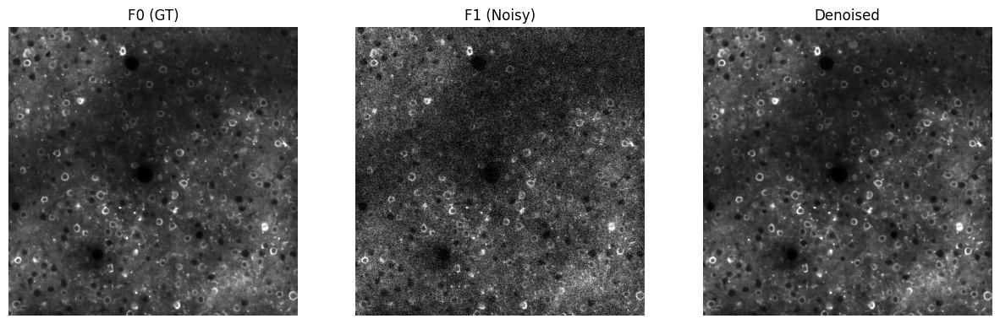

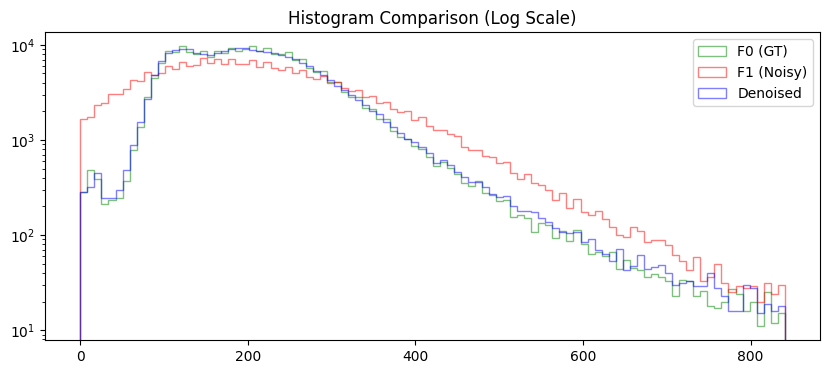

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def inspect_brightness(f0, f1, denoised, img_idx=0):
    """
    輸入三個影像 (假設都是 Numpy Array)
    """

    print(f"--- Inspecting frame index: {img_idx} ---")

    imgs = [f0[img_idx], f1[img_idx], denoised[img_idx]]
    names = ['F0 (GT)', 'F1 (Noisy)', 'Denoised']

    plt.figure(figsize=(15, 5))

    vmin, vmax = np.percentile(f0, (0, 99.9))

    for i, (img, name) in enumerate(zip(imgs, names)):
        # 1. 印出統計數值 (最準確)
        print(f"[{name}] Min: {img.min():.4f}, Max: {img.max():.4f}, Mean: {img.mean():.4f}, Median: {np.median(img):.4f}")

        # 2. 畫圖 (用同樣的 vmin/vmax 比較才公平)
        # 我們統一用 F0 的標準來看
    
        plt.subplot(1, 3, i+1)
        plt.title(name)
        plt.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
        plt.axis('off')

    plt.show()

    # 3. 畫直方圖 (檢查背景有沒有偏移)
    plt.figure(figsize=(10, 4))
    plt.title("Histogram Comparison (Log Scale)")
    for img, name, color in zip(imgs, names, ['green', 'red', 'blue']):
        # flatten 拉平，bins 設多一點
        plt.hist(img.flatten(), bins=100, range=(vmin, vmax),
                 alpha=0.5, label=name, color=color, log=True, histtype='step')
    plt.legend()
    plt.show()

# img_idx = (ground_truth.shape[0]) - 1
# inspect_brightness(ground_truth, valid_dataset.images[0], denoised_videos[0], img_idx=img_idx)
# inspect_brightness(ground_truth, valid_dataset.images[1], denoised_videos[1], img_idx=img_idx)
# inspect_brightness(ground_truth, valid_dataset.images[2], denoised_videos[2], img_idx=img_idx)